In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from bokeh import plotting
import sklearn as sl
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
from Funcoes import *
import random
from datetime import date
from datetime import datetime, timedelta
import plotly.express as px

import warnings
warnings.simplefilter('ignore')

from pylab import rcParams
rcParams['figure.figsize'] = 16, 8

In [5]:
data = pd.ExcelFile('dados60d.xlsx').parse('Sheet1')
#data = file.parse('Dados')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17281 entries, 0 to 17280
Data columns (total 35 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   index                  17281 non-null  object 
 1   VAZAO SELAGEM PRIM     17281 non-null  float64
 2   VAZAO VENT SELAGEM     17281 non-null  float64
 3   PRESS REATOR 1         17281 non-null  float64
 4   NIVEL TOPO REATOR      17281 non-null  float64
 5   TEMP TOPO REATOR       17281 non-null  float64
 6   TEMP AMBIENTE          17281 non-null  float64
 7   DELT PRESS FILTR OLEO  17281 non-null  float64
 8   PRESS OLEO LUB COMP    17281 non-null  float64
 9   DESLOC MANC AXIAL 2    17281 non-null  float64
 10  DESLOC MANC AXIAL 1    17281 non-null  float64
 11  TEMP ACOP LOA 2        17281 non-null  float64
 12  TEMP MANCAL MOT 2      17281 non-null  float64
 13  TEMP MANCAL MOT 1      17281 non-null  float64
 14  VIB MANCAL MOT 2       17281 non-null  float64
 15  VI

In [36]:
df = data.copy()
df.rename(columns={'index':'DATA'},inplace=True)
drop_vars = ['GRADE REATOR','DATA']
df = df.apply(lambda x: pd.to_numeric(x,errors='coerce') if x.name not in drop_vars else x)
df['DATA'] = pd.to_datetime(df['DATA'],dayfirst=True)


#df.drop(['VIB MANCAL MOT 2','VIB MANCAL MOT 1'],axis=1, inplace=True)

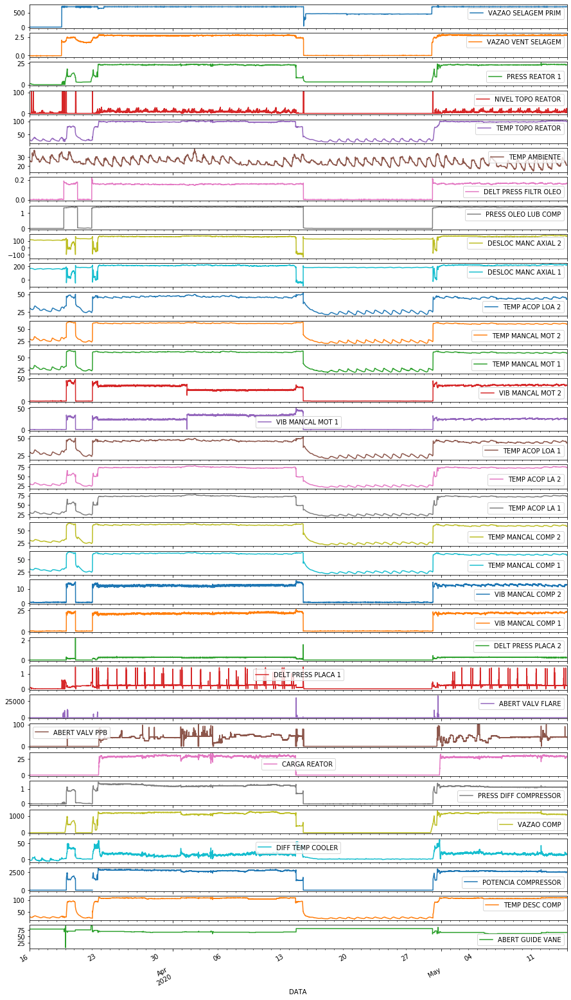

In [7]:
df.set_index('DATA').plot(figsize=(15,30),subplots=True);

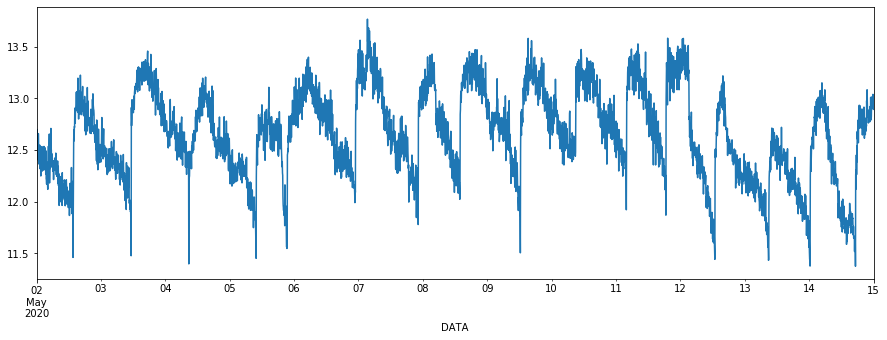

In [67]:
#df.set_index('DATA').loc['28-04-2020':'10-05-2020'];
df_set = df.set_index('DATA').loc['05-02-2020':'05-15-2020']
frame = df_set['VIB MANCAL COMP 2']
frame.plot(figsize=(15,5));

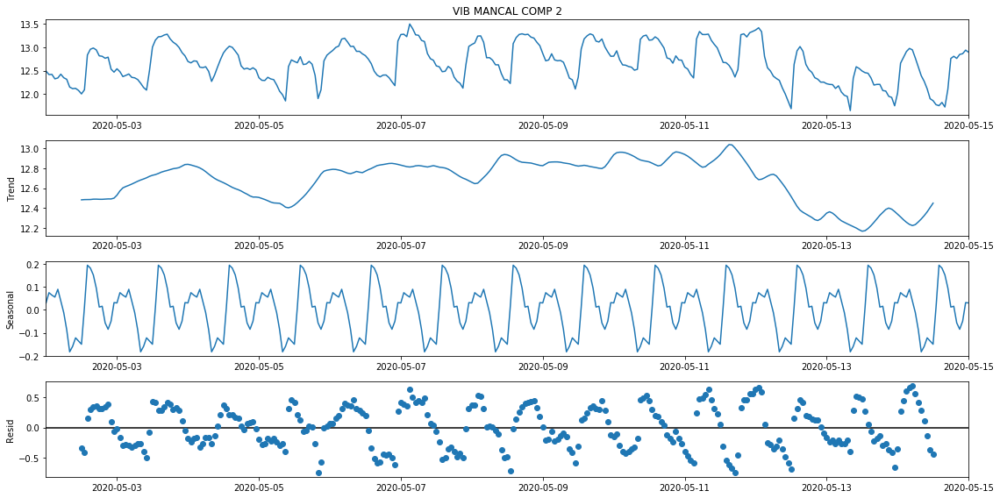

In [76]:
#Decomposição Temporal
from statsmodels.tsa.seasonal import seasonal_decompose
frame_res = frame.resample('1h').mean()
result = seasonal_decompose(frame_res, model='additive')
result.plot();

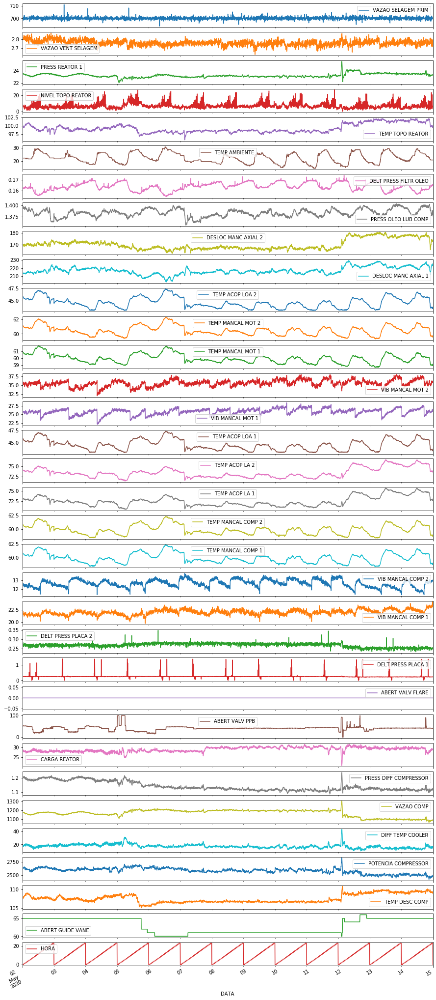

In [71]:
df_set.plot(subplots=True, figsize=(15,40));

In [65]:
df['HORA'] = df['DATA'].dt.hour.astype('float64')
df_set = df.set_index('DATA').loc['05-02-2020':'05-15-2020']

corr_vars = dataset.corr()['VIB MANCAL COMP 2'].abs().sort_values(ascending=False).index.to_list()

timeHeatmap(df_set.reindex(columns=corr_vars))


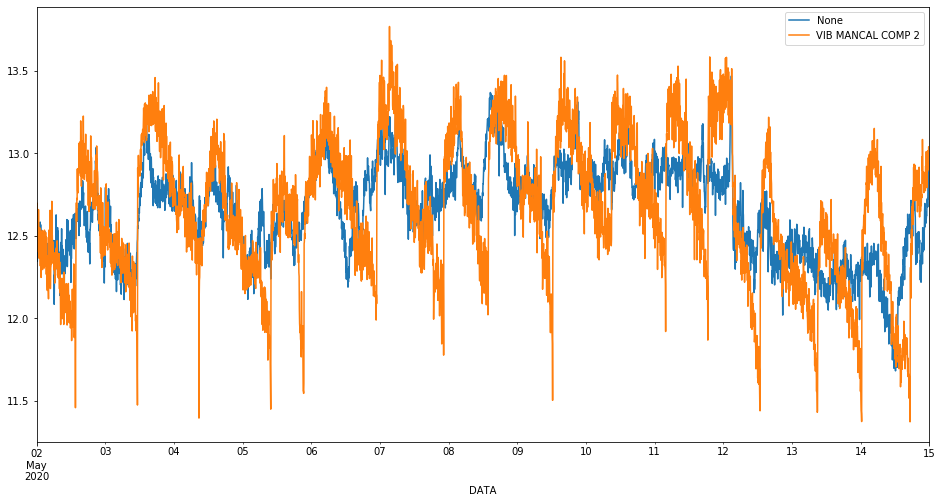

In [118]:
#REGRESSÃO OLS
import statsmodels.api as sm
import statsmodels.formula.api as smf

class trainOLS:
    def __init__(self,df,target_col,regressors_col):
        self.regressors_col = regressors_col
        self.model = sm.OLS(df[target_col],df[self.regressors_col])
        self.model = self.model.fit()
    
    def summary(self):
        return self.model.summary()
    
    def predict_OSL(self,df_window):
        return self.model.predict(df_window[self.regressors_col])
        

target = 'VIB MANCAL COMP 2'
regressors = [
#     'PRESS REATOR 1','DELT PRESS FILTR OLEO','PRESS OLEO LUB COMP',
#     'TEMP ACOP LA 1','TEMP MANCAL MOT 2',#'VIB MANCAL COMP 1'
# ]
       'VAZAO SELAGEM PRIM', 'VAZAO VENT SELAGEM', 'PRESS REATOR 1',
       'NIVEL TOPO REATOR', 'TEMP TOPO REATOR', 'TEMP AMBIENTE',
       'DELT PRESS FILTR OLEO', 'PRESS OLEO LUB COMP', 'DESLOC MANC AXIAL 2',
       'DESLOC MANC AXIAL 1', 'TEMP ACOP LOA 2', 'TEMP MANCAL MOT 2',
       'TEMP MANCAL MOT 1', 
       'TEMP ACOP LOA 1', 'TEMP ACOP LA 2', 'TEMP ACOP LA 1',
       'TEMP MANCAL COMP 2', 'TEMP MANCAL COMP 1',
       'DELT PRESS PLACA 2', 'DELT PRESS PLACA 1', 'ABERT VALV FLARE',
       'ABERT VALV PPB', 'CARGA REATOR',
       'PRESS DIFF COMPRESSOR', 'VAZAO COMP', 'DIFF TEMP COOLER',
       'POTENCIA COMPRESSOR', 'TEMP DESC COMP', 'ABERT GUIDE VANE', 'HORA',
        # 'VIB MANCAL MOT 1','VIB MANCAL COMP 1','VIB MANCAL MOT 2',
] #df_set.columns.drop(target)

trainOLS(df_set,target,regressors).predict_OSL(df_set).plot(legend='sadsa')
df_set[target].plot(legend='dsa')



In [119]:
#df_set.columns.drop(target)
#df_set[regressors].info()
trainOLS(df_set,target,regressors).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:      VIB MANCAL COMP 2   R-squared (uncentered):                   0.999
Model:                            OLS   Adj. R-squared (uncentered):              0.999
Method:                 Least Squares   F-statistic:                          1.971e+05
Date:                Thu, 21 May 2020   Prob (F-statistic):                        0.00
Time:                        18:59:49   Log-Likelihood:                         -1079.8
No. Observations:                3745   AIC:                                      2218.
Df Residuals:                    3716   BIC:                                      2398.
Df Model:                          29                                                  
Covariance Type:            nonrobust                                                  
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
VAZAO SELAGEM PRIM        0.0016      0.005      0.342      0.732      -0.007       0.010
VAZAO VENT SELAGEM        1.2804      0.237      5.393      0.000       0.815       1.746
PRESS REATOR 1           -0.0985      0.074     -1.327      0.185      -0.244       0.047
NIVEL TOPO REATOR        -0.0043      0.002     -2.225      0.026      -0.008      -0.001
TEMP TOPO REATOR         -0.0428      0.022     -1.971      0.049      -0.085      -0.000
TEMP AMBIENTE             0.0157      0.005      3.462      0.001       0.007       0.025
DELT PRESS FILTR OLEO   -51.5484      8.357     -6.168      0.000     -67.933     -35.164
PRESS OLEO LUB COMP      19.2130      1.146     16.767      0.000      16.966      21.460
DESLOC MANC AXIAL 2      -0.0709      0.010     -7.398      0.000      -0.090      -0.052
DESLOC MANC AXIAL 1       0.0796      0.005     15.767      0.000       0.070       0.089
TEMP ACOP LOA 2          -0.1220      0.183     -0.668      0.504      -0.480       0.236
TEMP MANCAL MOT 2         0.4542      0.134      3.402      0.001       0.192       0.716
TEMP MANCAL MOT 1        -0.1995      0.096     -2.079      0.038      -0.388      -0.011
TEMP ACOP LOA 1           0.1300      0.179      0.728      0.466      -0.220       0.480
TEMP ACOP LA 2            0.1309      0.157      0.833      0.405      -0.177       0.439
TEMP ACOP LA 1           -0.0825      0.164     -0.502      0.615      -0.404       0.239
TEMP MANCAL COMP 2       -0.6824      0.201     -3.390      0.001      -1.077      -0.288
TEMP MANCAL COMP 1        0.1833      0.204      0.900      0.368      -0.216       0.583
DELT PRESS PLACA 2        0.4155      0.868      0.479      0.632      -1.286       2.117
DELT PRESS PLACA 1       -0.0134      0.057     -0.234      0.815      -0.126       0.099
ABERT VALV FLARE      -4.943e-13   7.76e-14     -6.369      0.000   -6.46e-13   -3.42e-13
ABERT VALV PPB           -0.0026      0.001     -4.541      0.000      -0.004      -0.001
CARGA REATOR             -0.0575      0.012     -4.842      0.000      -0.081      -0.034
PRESS DIFF COMPRESSOR     1.4098      0.915      1.540      0.124      -0.385       3.205
VAZAO COMP                0.0035      0.001      4.502      0.000       0.002       0.005
DIFF TEMP COOLER         -0.0138      0.005     -2.761      0.006      -0.024      -0.004
POTENCIA COMPRESSOR       0.0001      0.000      0.496      0.620      -0.000       0.001
TEMP DESC COMP            0.0190      0.024      0.805      0.421      -0.027       0.065
ABERT GUIDE VANE         -0.0780      0.012     -6.544      0.000      -0.101      -0.055
HORA                     -0.0010      0.001     -1.063      0.288      -0.003       0.001
==============

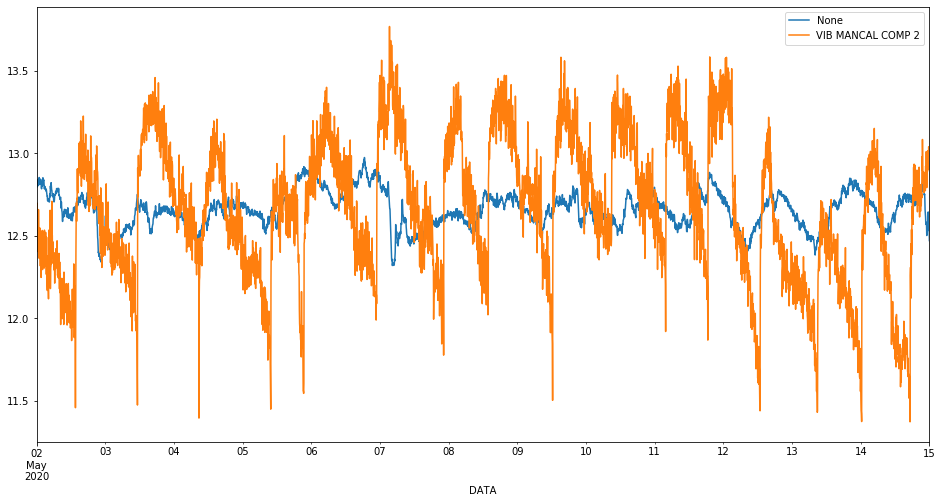

In [121]:
target = 'VIB MANCAL COMP 2'
regressors = [
    'PRESS OLEO LUB COMP','DESLOC MANC AXIAL 1'
]
trainOLS(df_set,target,regressors).predict_OSL(df_set).plot(legend='sadsa')
df_set[target].plot(legend='dsa')

In [73]:
import plotly.graph_objs as go
from sklearn.preprocessing import MinMaxScaler


def timeHeatmap(df):
    df_in = df.copy()
    scaler = MinMaxScaler()
    local_filter = df_in.select_dtypes('float64').columns
    df_real_values = df_in[local_filter].copy()
    df_in[local_filter] = scaler.fit_transform(df_in[local_filter])
    df_in = df_in[local_filter]
    
    
    # figure data
    data = [
        go.Heatmap(
        x=df_in.index,
        y=df_in.columns,
        z=df_in.T,
        name='',
        showscale=True,
        customdata=df_real_values.T,
        hovertemplate=
            '<b>Data:</b> %{x}' + '<br>'
            '<b>Variável:</b> %{y}' + '<br>'
            '<b>Valor Real:</b> %{customdata:,.2f}' + '<br>'
            '<b>Valor Norm.:</b> %{z:.2f}',

        
        ),
    ]
    # figure layout
    layout = go.Layout(
        xaxis={'title':'Data'},
        yaxis={'autorange': 'reversed', 'automargin': True,'tickfont':{'size':10}}, #'title':'Variáveis',
        #title={'text':'Variação dos valores no tempo'},
        autosize=True,
        margin=dict(l=30, r=30, b=40, t=30),
        #showlegend=True,
    )
    
    return go.Figure(data=data, layout=layout)

In [14]:
lista_eventos = [
    ('05-02-2020','05-03-2020'),
    ('05-03-2020','05-04-2020'),
    ('05-05-2020','05-06-2020'),
    ('05-07-2020','05-08-2020'),
]

Quantidade de Linhas: 576
Data Inicial: 1
Data Final: 1


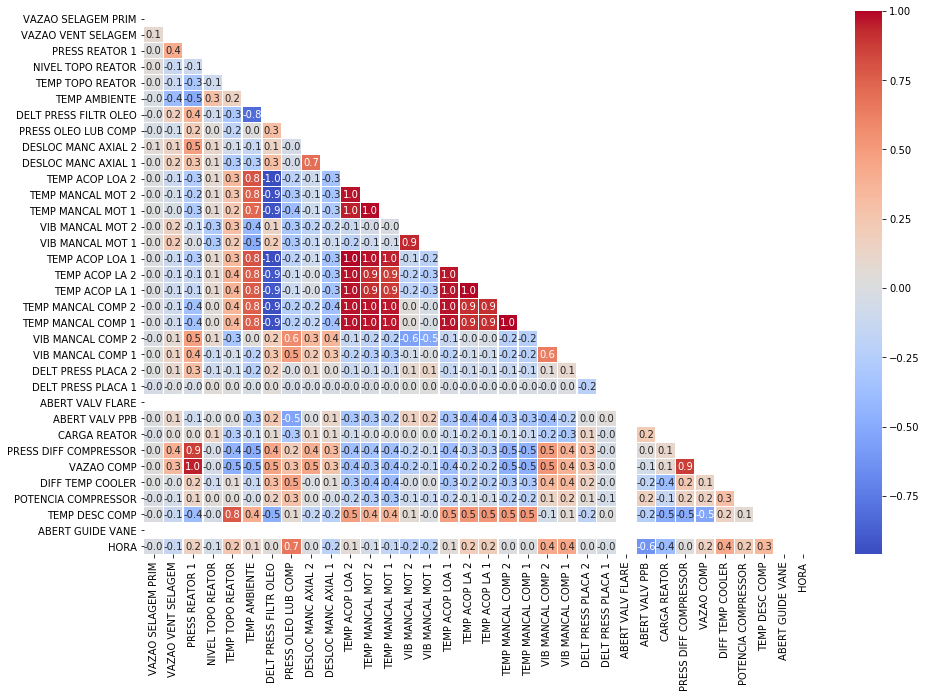

In [59]:
evento = lista_eventos[1]
dataset = df.set_index('DATA').loc[evento[0]:evento[1]]
#['VIB MANCAL COMP 2']
plot_corr(dataset,1,1)
#dataset.reset_index(drop=True)


In [61]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 576 entries, 2020-05-03 00:00:00 to 2020-05-04 23:55:00
Data columns (total 35 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   VAZAO SELAGEM PRIM     576 non-null    float64
 1   VAZAO VENT SELAGEM     576 non-null    float64
 2   PRESS REATOR 1         576 non-null    float64
 3   NIVEL TOPO REATOR      576 non-null    float64
 4   TEMP TOPO REATOR       576 non-null    float64
 5   TEMP AMBIENTE          576 non-null    float64
 6   DELT PRESS FILTR OLEO  576 non-null    float64
 7   PRESS OLEO LUB COMP    576 non-null    float64
 8   DESLOC MANC AXIAL 2    576 non-null    float64
 9   DESLOC MANC AXIAL 1    576 non-null    float64
 10  TEMP ACOP LOA 2        576 non-null    float64
 11  TEMP MANCAL MOT 2      576 non-null    float64
 12  TEMP MANCAL MOT 1      576 non-null    float64
 13  VIB MANCAL MOT 2       576 non-null    float64
 14  VIB MANCAL MOT 1     

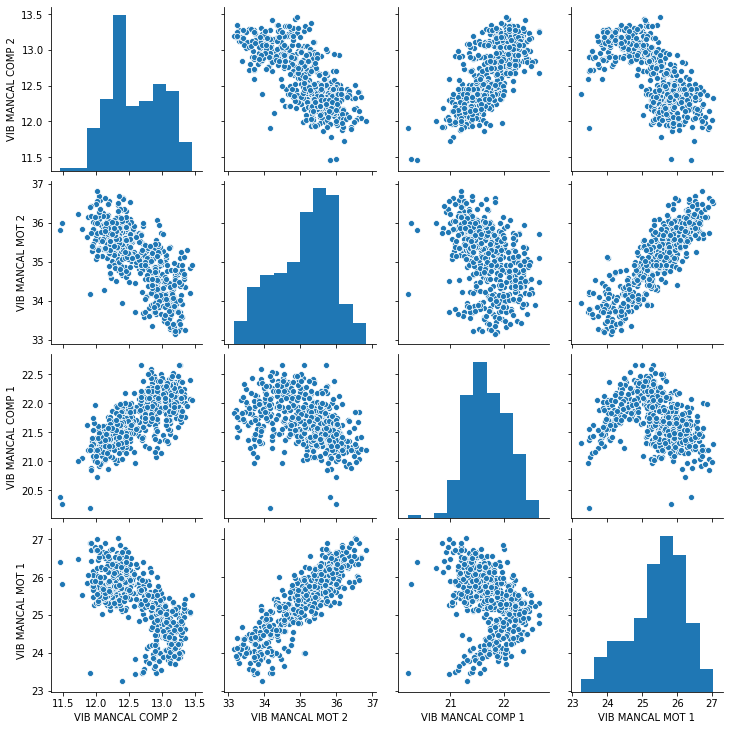

In [119]:
sns.pairplot(dataset[corr_vars]);

In [75]:

# Função para plotar KDE de várias variáveis
import math
def plot_kde(df,label_col=None): 
    """
    Plota multiplos gráficos KDE (um para cada coluna do DF) com separação por uma determinada
    coluna de labels (label_col [str])
    """
    float_cols = df.select_dtypes(include=['float64']).columns
    i = len(float_cols)
    
    cols = 3
    rows = math.ceil(i/cols)
    
    axis_list = []
    for row in range(rows): 
        for col in range(cols): axis_list.append((row,col))
    
    fig,ax = plt.subplots(rows,cols,figsize=(15,rows*3.5))
    
    for n,ii in zip(df[float_cols],axis_list): #ZIP
        if label_col is None:
            sns.kdeplot(df[n],label='', ax=ax[ii])
        else:
            for label in df[label_col].unique():
                    flt = df[label_col]==label
                    sns.kdeplot(df[flt][n],label=label, ax=ax[ii])

        ax[ii].set_ylabel(n, fontsize=10)
        ax[ii].set_yticks([])
    
    fig.tight_layout()